![Текст ссылки](https://as1.ftcdn.net/v2/jpg/04/55/23/28/1000_F_455232842_2SJckx1hPBALY5uEqdaQrIL8gsbju023.jpg)

# Optimal locations for bikeshare stations in Khamovniki district, Moscow





**Task:** For the Khamovniki district in Moscow, analyze the optimal location of bike rental stations. The task is to ensure that each exit from the metro and the main attractions (Novodevichy, Luzhniki, etc.) have **a bike within a radius of no more than 500 m**

# Import 

## Packages

Let's install and import all necessary python-packages for geospatial analysis

In [ ]:
!pip install osmnx==1.2.1 --quiet

In [2]:
import osmnx as ox

In [ ]:
!pip install pysal==2.1.0 --quiet

In [ ]:
from pysal.explore.esda.moran  import Moran

This order of import is required to prevent conflict between imported packages

In [ ]:
!pip install geopandas --quiet
!pip install folium  --quiet
!pip install pygeos --quiet
!pip install contextily --quiet
!pip install mapclassify --quiet
!pip install libpysal --quiet
!pip install h3 --quiet
!pip install pykrige --quiet
!pip install alphashape --quiet
!pip install ox --quiet
!pip install overpy --quiet
!pip install spopt --quiet

In [6]:
import warnings
warnings.simplefilter("ignore")
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib as mpl
import matplotlib.cm as cm
import matplotlib.colors as mcolors
from matplotlib.patches import Patch
import matplotlib.lines as mlines
%matplotlib inline
from pysal.explore.esda.moran  import Moran
from libpysal.weights import Queen, Rook, KNN
import seaborn as sns
from shapely.geometry import Point
import geopandas as gpd
import overpy
import contextily as ctx
from shapely.geometry import shape
from shapely.ops import linemerge, unary_union, polygonize
from shapely.geometry import Polygon, LineString
import folium
from folium import Choropleth, Circle, Marker, CircleMarker
from folium.plugins import HeatMap, MarkerCluster
import networkx as nx
import h3
import alphashape
import requests
from shapely import wkt
from tqdm import tqdm
from geopy.geocoders import Nominatim  
import requests 
from bs4 import BeautifulSoup
import csv
import time
import pulp
from spopt.locate.coverage import LSCP
import spaghetti

## Geographical data

### District

Polygon of Khamovniki District will be parsed from Open Street Maps.

In [7]:
# Function for extracting geo-spatial data from Open Street Maps
def osm_polygon(loc_name):
  overpass_query = \
  f'''[out:json]
  ;
  area["name"="{loc_name}"]; 
  (
    relation
      ["boundary"="administrative"]
      ["admin_level"="8"]
      (area);
  );
  (
    ._;
    >;
  );
  out geom;
  '''
  api = overpy.Overpass()
  hamov_borders = api.query(overpass_query)
  lss = []
  for ii_w,way in enumerate(hamov_borders.ways):
      ls_coords = []
      for node in way.nodes:
          ls_coords.append((node.lon,node.lat)) # 
      lss.append(LineString(ls_coords)) 
  borders = linemerge([*lss]) 
  district = Polygon(borders.coords) 
  gdf_district = gpd.GeoDataFrame(index=[0], crs='epsg:4326', geometry=[district])
  return gdf_district, district

In [8]:
gdf_district, district = osm_polygon("район Хамовники" )

### Metro stations

Let's extract data of metro-stations in Khamovniki District 

DataFrame of Moscow Metro Stations is taken from https://data.mos.ru

In [9]:
metro_stations = pd.read_excel('/content/metro_stations.xlsx')[['Name', 'geometry']]
metro_stations['geometry'] = metro_stations['geometry'].apply(wkt.loads)
df_subway = gpd.GeoDataFrame(metro_stations, crs='epsg:4326',  geometry='geometry')\
  .clip(district).reset_index(drop=True) # let's cut out stations located out of district

In [10]:
df_subway

,Name,geometry
0,"Кропоткинская, вход-выход 3 в северный вестибюль",POINT (37.60533 55.74565)
1,"Кропоткинская, вход-выход 2 в северный вестибюль",POINT (37.60539 55.74584)
2,"Воробьёвы горы, вход-выход 4 в северный вестибюль",POINT (37.56164 55.71173)
3,"Воробьёвы горы, вход 3 в северный вестибюль",POINT (37.56108 55.71191)
4,"Лужники, вход-выход",POINT (37.56093 55.72088)
5,"Спортивная, вход-выход 1 в южный вестибюль",POINT (37.56187 55.72229)
6,"Спортивная, вход-выход 2 в северный вестибюль",POINT (37.56570 55.72383)
7,"Спортивная, выход из северного вестибюля",POINT (37.56551 55.72400)
8,"Фрунзенская, вход-выход 1 в вестибюль",POINT (37.58058 55.72743)
9,"Парк культуры, вход-выход 1 в вестибюль",POINT (37.59333 55.73531)


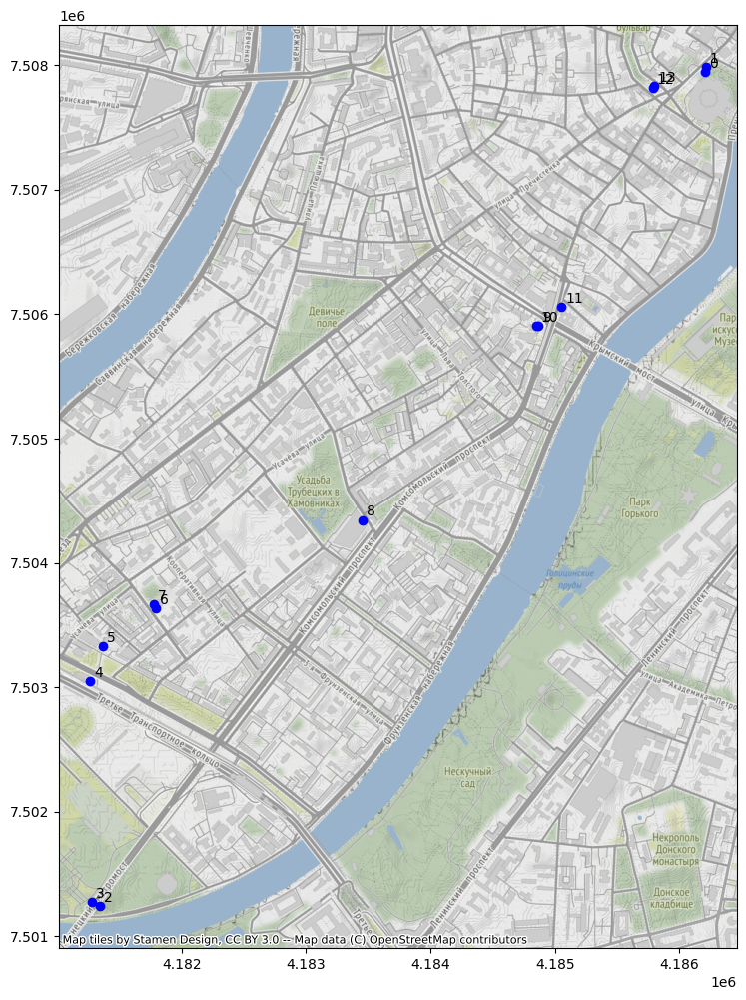

In [11]:
fig,ax = plt.subplots(1,1,figsize=(12,12))
df_subway.to_crs('epsg:3857').plot(ax=ax, color='blue')
for x, y, label in zip(df_subway.to_crs('epsg:3857').geometry.x, df_subway.to_crs('epsg:3857').geometry.y, df_subway.index):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")

ctx.add_basemap(ax=ax)

As we see, entries of some stations are too close to each other.  
Some points are worth to discard from the dataset.  
These are: 1,2,5,6,10,11,13

In [12]:
entries_to_drop = [1,2,5,6,10,11,13]
df_subway_fixed = df_subway[df_subway.index.isin(entries_to_drop) == False]
df_subway_fixed

,Name,geometry
0,"Кропоткинская, вход-выход 3 в северный вестибюль",POINT (37.60533 55.74565)
3,"Воробьёвы горы, вход 3 в северный вестибюль",POINT (37.56108 55.71191)
4,"Лужники, вход-выход",POINT (37.56093 55.72088)
7,"Спортивная, выход из северного вестибюля",POINT (37.56551 55.72400)
8,"Фрунзенская, вход-выход 1 в вестибюль",POINT (37.58058 55.72743)
9,"Парк культуры, вход-выход 1 в вестибюль",POINT (37.59333 55.73531)
12,"Кропоткинская, вход-выход 1 в южный вестибюль",POINT (37.60156 55.74498)


### Attractions

Coordinates of attractions will be parsed from TripAdvisor.ru.  
Parsing algorithm will take information from first 30 most popular attractions in Khamovniki district.

In [13]:
# Functioin for extracting information from TripAdvisor.ru
def get_page_contents(url):
    user_agent = ({'User-Agent':
			'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/108.0.0.0 Safari/537.36',
			'Accept-Language': 'ru-RU, ru;q=0.9'})
    page = requests.get(url, headers = user_agent)
    return BeautifulSoup(page.text, 'html.parser')

In [14]:
# Let's get data from url-page containing info about attractions in Khamovniki District
url = ('https://www.tripadvisor.ru/Attractions-g298484-Activities-c47-zfn8707997-Moscow_Central_Russia.html')
soup = get_page_contents(url)

In [15]:
# Let's extract addresses of attractions and parse coordinates through Geopy
names, addresses, geometry = [], [], []
# geopy makes it easy for to locate the coordinates
geolocator = Nominatim(user_agent="Tester")
divs = soup.findAll('div',{'class':'alPVI eNNhq PgLKC tnGGX'})
for div in divs:
  href = div.findAll('a')[0]['href']
  new_url = 'https://www.tripadvisor.ru/' + href
  attraction_page = get_page_contents(new_url)
  name = attraction_page.findAll('h1')[0].text
  names.append(name);
  try:
    address = list(filter(lambda x: 'Москва' in x.text, attraction_page.findAll('span',{'class':"biGQs _P XWJSj Wb"})))[0].text
    location = geolocator.geocode(address)
    addresses.append(address);
  except:
    addresses.append(None)
    if 'Москва' not in name:
      name = name + ' Москва'
    location = geolocator.geocode(name)
  if location is None:
    geometry.append(None)
    continue
  coord = Point([location.longitude, location.latitude, ])
  geometry.append(coord)
attractions =  gpd.GeoDataFrame(pd.DataFrame({'Name': names,'address': addresses, 'geometry': geometry}), crs='epsg:4326',  geometry='geometry')

Let's check dataframe of parsed attractions

In [16]:
attractions

,Name,address,geometry
0,Храм Христа Спасителя,"Волхонка, д. 15, Москва 119019 Россия",POINT (37.60485 55.74585)
1,Богородице-Смоленский Новодевичий монастырь,"Новодевичий проезд, 1 м. Спортивная, Москва 11...",None
2,Крымский мост,None,POINT (37.59898 55.73401)
3,Стадион Лужники,"ул. Лужники, 24 м. Спортивная, Москва 119270 Р...",None
4,Храм Святителя Николая в Хамовниках,"ул. Льва Толстого, д. 2, Москва 119034 Россия",POINT (37.58769 55.73336)
5,Зачатьевский монастырь,"2-й Зачатьевский пер., 2, Москва 119034 Россия",POINT (37.59997 55.73976)
6,Церковь Илии Пророка Обыденного,None,POINT (37.60377 55.74225)
7,Новодевичье кладбище,"Лужнецкий пр-д, 2, Москва 119048 Россия",None
8,Дом Перцовой,"Курсовой пер., 1, Москва 119034 Россия",POINT (37.60645 55.74253)
9,Памятник Александру II,"ул. Волхонка, 13, Москва 119019 Россия",POINT (37.60673 55.74637)


As we can see, coordinates of some locations are absent.  
We can fix them manually and parse through geopy.

In [17]:
fixed_addresses = [('Новодевичий проезд, 1, Москва', 1), ('Лужники, 24, Москва',3), ('Лужнецкий проезд, 2, Москва', 7),
                   ('Усадьба Трубецких, Москва', 11), ('ул. Остоженка, 3/14, Москва, 119034',13),
                   ('Большой Левшинский пер., 2/6, Москва, 119034', 20), ('2-й Обыденский пер., 8/8, Москва, 119034',21),
                   ('1-й Тружеников пер., 8/1, Москва, 119121',27)]
for address, num in fixed_addresses:
  location = geolocator.geocode(address)
  if location is None:
    continue
  coord = Point([location.longitude, location.latitude, ])
  attractions.geometry.loc[num] = coord
  time.sleep(5) 

In [24]:
# let's drop location 29 without coordinates
attractions_main = attractions[attractions.geometry != None][['Name', 'geometry']].clip(district)

In [ ]:
attractions_main

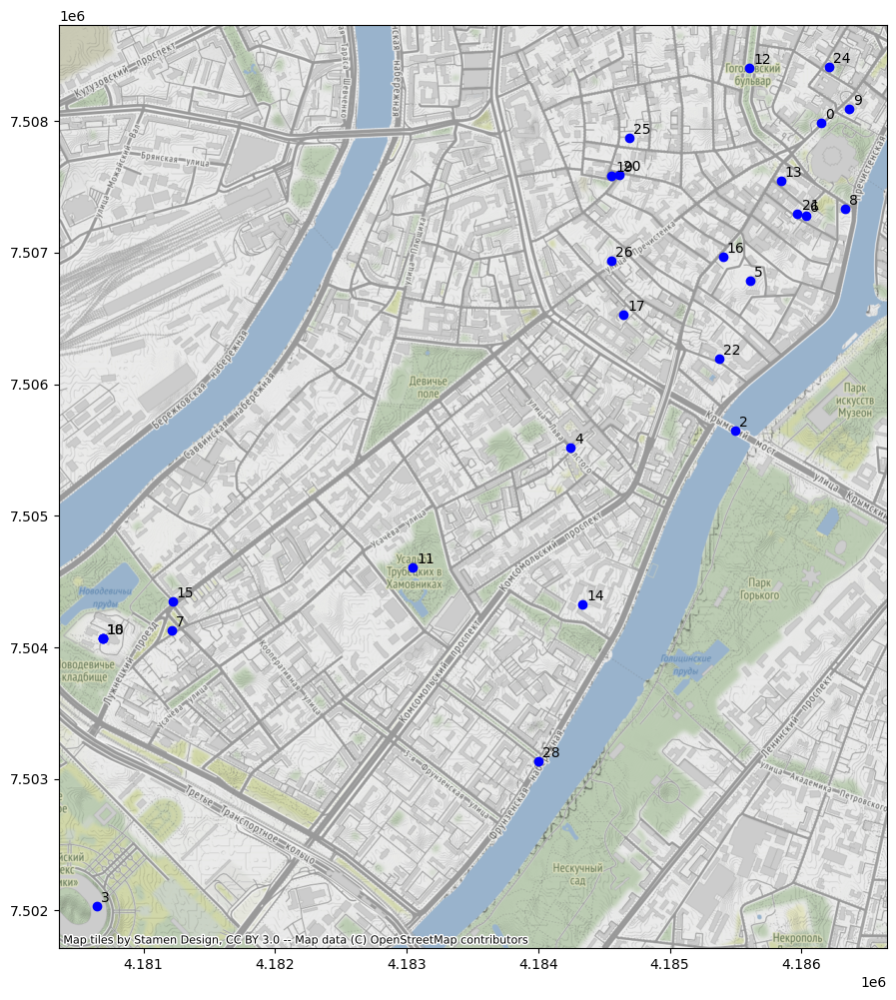

In [28]:
fig,ax = plt.subplots(1,1,figsize=(12,12))
attractions_main.to_crs('epsg:3857').plot(ax=ax, color='blue')
for x, y, label in zip(attractions_main.to_crs('epsg:3857').geometry.x, attractions_main.to_crs('epsg:3857').geometry.y, attractions_main.index):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
# df_subway_fixed.to_crs('epsg:3857').plot(ax=ax, color='brown')
ctx.add_basemap(ax=ax)

We will also add 2 more attractions in areas not covered by points

In [19]:
# function to add new point of interest to DataFrame
def new_point(gdf, name):
  location = geolocator.geocode(name)
  if location is None:
    print('Локация не найдена')
    return gdf
  coord = Point([location.longitude, location.latitude, ])
  gdf = gdf.append({'Name': name, 'geometry': coord}, ignore_index=True)
  gdf.crs='epsg:4326'
  return gdf

In [29]:
attractions_main = new_point(attractions_main, 'Государственный центральный концертный зал')
attractions_main = new_point(attractions_main, 'Сквер Девичьего поля')

These data will be considered as **points of interest**.

In [21]:
attractions_main

,Name,geometry
0,Стадион Лужники,POINT (37.55538 55.71573)
1,Богородице-Смоленский Новодевичий монастырь,POINT (37.55577 55.72603)
2,Собор Смоленской Иконы Божией Матери в Новодев...,POINT (37.55577 55.72603)
3,Скульптура Дайте дорогу утятам,POINT (37.55577 55.72603)
4,Новодевичье кладбище,POINT (37.56048 55.72633)
5,Храм Успения Пресвятой Богородицы в Новодевичь...,POINT (37.56054 55.72745)
6,Усадьба Трубецких,POINT (37.57697 55.72875)
7,Фрунзенская набережная,POINT (37.58552 55.72132)
8,Храм Святителя Николая в Хамовниках,POINT (37.58769 55.73336)
9,Памятник героям фильма Офицеры,POINT (37.58852 55.72734)


There points should be at the distance of 300m from bike stations.

In [22]:
target_points = pd.concat([attractions_main[['Name', 'geometry']], df_subway_fixed[['Name', 'geometry']]], ignore_index=True) # concatenate all points of interest
target_points_utm = target_points.to_crs('epsg:32637')

In [23]:
target_points_utm

,Name,geometry
0,Стадион Лужники,POINT (409245.271 6175387.729)
1,Богородице-Смоленский Новодевичий монастырь,POINT (409293.945 6176532.721)
2,Собор Смоленской Иконы Божией Матери в Новодев...,POINT (409293.945 6176532.721)
3,Скульптура Дайте дорогу утятам,POINT (409293.945 6176532.721)
4,Новодевичье кладбище,POINT (409590.622 6176559.598)
5,Храм Успения Пресвятой Богородицы в Новодевичь...,POINT (409596.508 6176684.229)
6,Усадьба Трубецких,POINT (410631.160 6176807.714)
7,Фрунзенская набережная,POINT (411151.713 6175970.328)
8,Храм Святителя Николая в Хамовниках,POINT (411315.197 6177306.962)
9,Памятник героям фильма Офицеры,POINT (411353.825 6176636.525)


Now let's look at map of Khamovniki District.  
Red points - metro stations.  
Blue points - attractions.

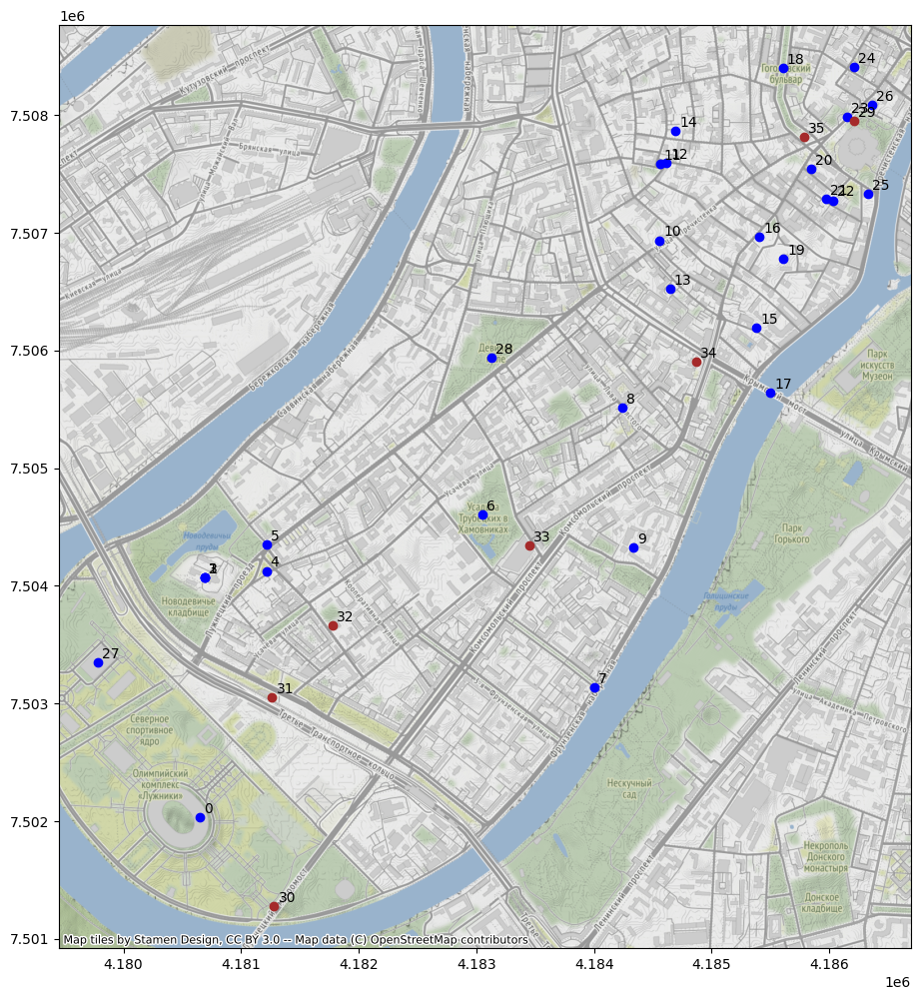

In [31]:
fig,ax = plt.subplots(1,1,figsize=(12,12))
target_points_utm.iloc[:29].to_crs('epsg:3857').plot(ax=ax, color='blue')
target_points_utm.iloc[29:].to_crs('epsg:3857').plot(ax=ax, color='brown')
for x, y, label in zip(target_points_utm.to_crs('epsg:3857').geometry.x, target_points_utm.to_crs('epsg:3857').geometry.y, target_points_utm.index):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
ctx.add_basemap(ax=ax)

# First attempt

Let's move on to the preliminary procedures for constructing isochrones

## Building graph

Now let's build graph of edges (as potential paths for cyclists) and nodes (crossways and potential spots for bike stations)

In [32]:
# Function to transform directed graph to undirected
def gdf_district_to_undir_graph(gdf_district, network_type, tolerance):
  gr_ham = ox.graph_from_polygon(gdf_district.geometry.iloc[0],  network_type=network_type,
                                   simplify=True,
                                   retain_all=False,
                                   truncate_by_edge=True,
                                   clean_periphery=False)
  g_proj_ham = ox.project_graph(gr_ham, to_crs ='epsg:32637')
  g_proj_ham_console_dead = ox.simplification.consolidate_intersections(g_proj_ham, rebuild_graph=True, 
                                                                        tolerance=tolerance, dead_ends=False)
  g_undir = ox.utils_graph.get_undirected(g_proj_ham_console_dead)
  return g_undir

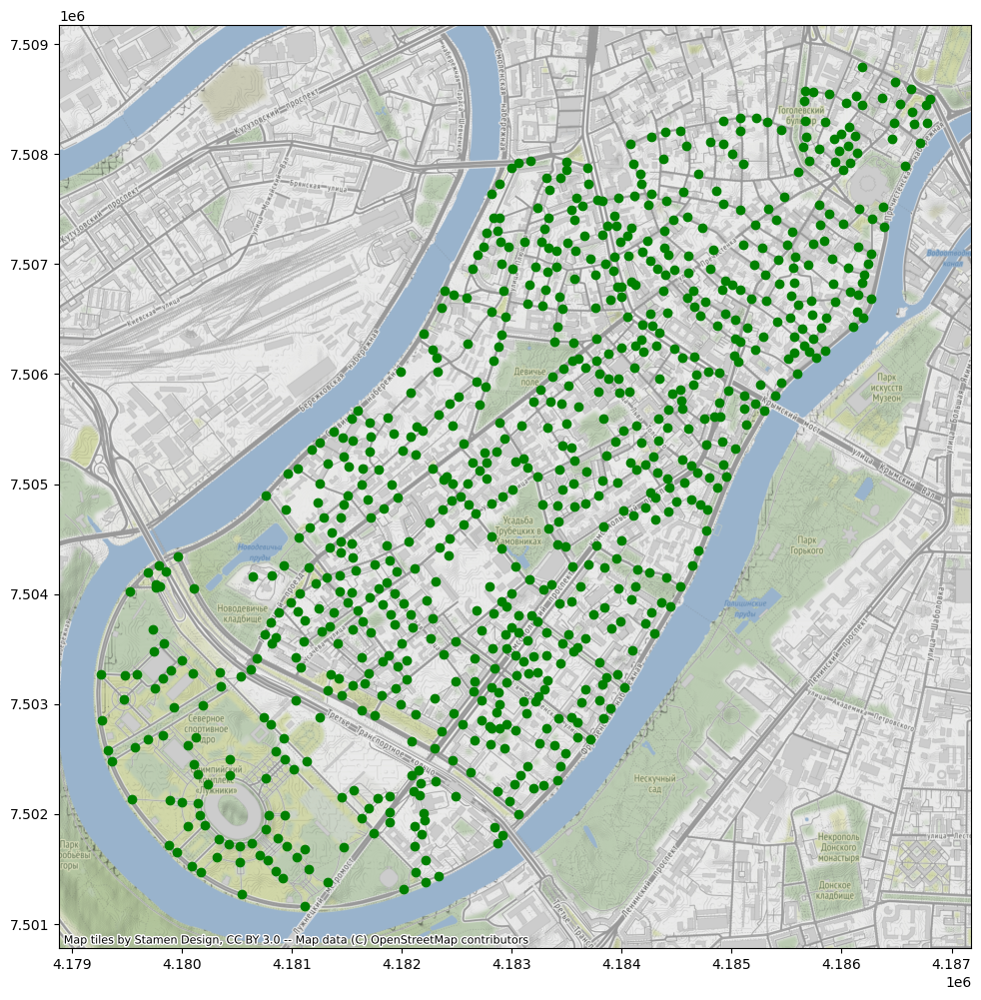

In [34]:
g_undir = gdf_district_to_undir_graph(gdf_district,network_type='bike', tolerance=20) # get undirected graph for geo-analysis
gdf_nodes, gdf_edges = ox.graph_to_gdfs(g_undir,nodes=True,edges=True, 
                                        node_geometry=True,  fill_edge_geometry=True) # get nodes of crossways and edges
fig,ax = plt.subplots(1,1,figsize=(12,12))
gdf_nodes.to_crs('epsg:3857').plot(ax=ax, color='green')
ctx.add_basemap(ax=ax) # Visualize all crossways

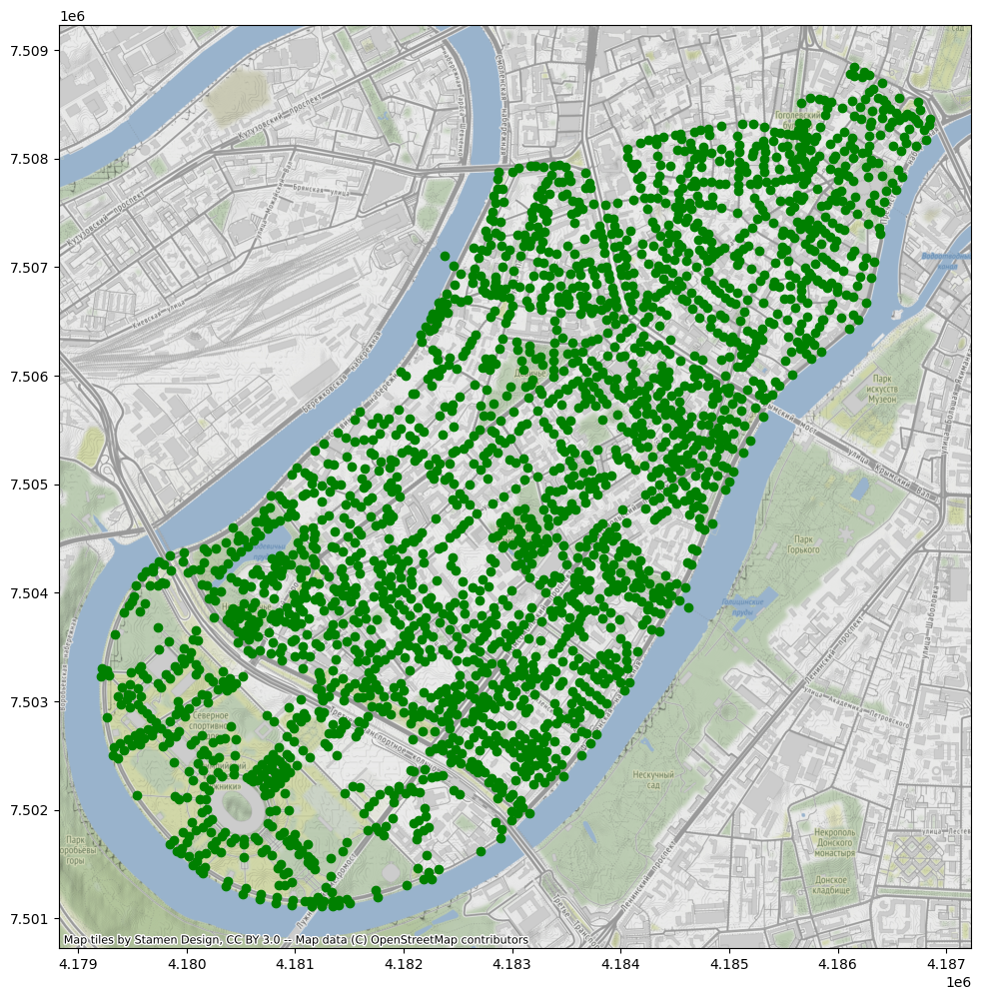

In [ ]:
g_undir = gdf_district_to_undir_graph(gdf_district,network_type='walk', tolerance=10) # get undirected graph for geo-analysis
gdf_nodes, gdf_edges = ox.graph_to_gdfs(g_undir,nodes=True,edges=True, 
                                        node_geometry=True,  fill_edge_geometry=True) # get nodes of crossways and edges
fig,ax = plt.subplots(1,1,figsize=(12,12))
gdf_nodes.to_crs('epsg:3857').plot(ax=ax, color='green')
ctx.add_basemap(ax=ax) # Visualize all crossways

## Network representation

Let's build network representation of road network through spaghetti-package

In [35]:
def ntw_snap(gdf_edges, gdf_nodes, target_points_utm):
  ntw = spaghetti.Network(in_data = gdf_edges)
  ntw.snapobservations(target_points_utm, "Number", attribute=True)
  target_snapped = spaghetti.element_as_gdf(ntw, pp_name="Number", snapped=True)
  ntw.snapobservations(gdf_nodes, "osmid_original", attribute=True)
  nodes_snapped = spaghetti.element_as_gdf(ntw, pp_name="osmid_original", snapped=True)
  return target_snapped, nodes_snapped, ntw

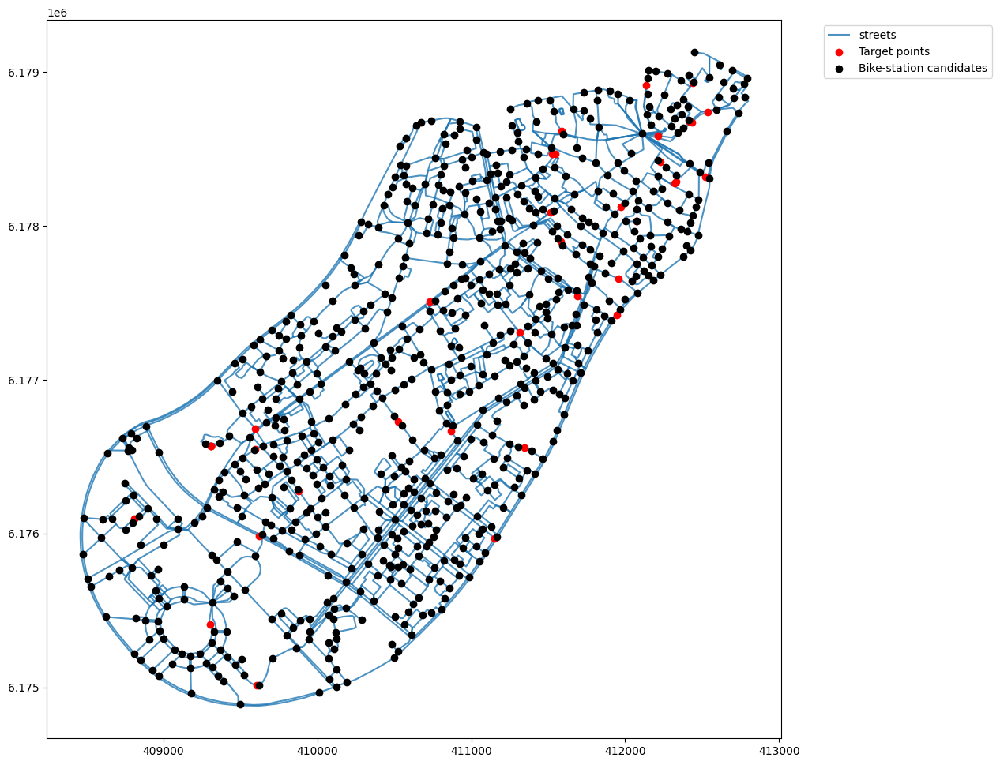

In [36]:
target_snapped, nodes_snapped, ntw = ntw_snap(gdf_edges, gdf_nodes,target_points_utm)
fig, ax = plt.subplots(figsize=(12, 12))
gdf_edges.plot(ax=ax, alpha=0.8, zorder=1, label='streets')
target_snapped.plot(ax=ax, color='red', zorder=2, label='Target points')
nodes_snapped.plot(ax=ax, color='black', zorder=3, label='Bike-station candidates')
plt.legend(loc='upper left', bbox_to_anchor=(1.05, 1))

## Isochrones formation

Let's calculate isochrones of 300m radius from points of interest

In [49]:
def make_iso_poly(subgraph, node, area_bad=10, if_print=True):
    """
    Function for building an isochrone
     subgraph - the subgraph within the specified radius
     area_bad - polygon area threshold, at which we consider that the isochron was not built or it is one street
     if_print - print result or not
    """
    
   
    gdf_sub_nodes = ox.graph_to_gdfs(subgraph,
                                            nodes=True, 
                                            edges= False, 
                                            node_geometry=True
                                           )
    if if_print:
        print(f"Number of vertices inside the isochrone: {len(gdf_sub_nodes)}")
    try:
        conv_hull = gdf_sub_nodes.geometry.unary_union.convex_hull.exterior
    except:
        pass
    l=1
    n = -0.002
    k=0
    cond = True
    
    
    while l==1 and cond and k<10 :
        k+=1
        if if_print:
            print ("="*10)
        n_new=n + 0.002 

        bounding_poly = alphashape.alphashape(gdf_sub_nodes.geometry, n_new)
        
        if bounding_poly.geom_type=='Polygon':
            if bounding_poly.area<area_bad:  
                l=0
            else:
                l=1 
        else: 
            break 
        if if_print:
            print(f"Attempt №{k}, number of polygones:{l}")

        gdf_sub_nodes_cliped = gdf_sub_nodes.clip(bounding_poly) 
        cond = gdf_sub_nodes_cliped.shape== gdf_sub_nodes.shape
        if if_print:
            print(f"Check if all vertices are present in an isochrone: { cond}")


        if l==1 and if_print:
            fig, ax=plt.subplots(1,1,figsize=(5,5))
            ox.graph_to_gdfs(subgraph,
                                                    nodes=False, 
                                                    edges= True, 
                                                    node_geometry=True
                                                   ).plot(ax=ax)
            ax.plot(subgraph.nodes[node]['x'],subgraph.nodes[node]['y'], color='red', marker='*', markersize=10, linewidth=0.5)
            ax.plot(*bounding_poly.exterior.coords.xy, color='green', zorder=2,linewidth=4);
            ax.plot(*conv_hull.coords.xy, color='black', linewidth=3)

            plt.show()
        if cond and l==1:
            n=n_new

    bounding_poly_fin = alphashape.alphashape(gdf_sub_nodes.geometry, n)
    if if_print:
        print(f"Number of attempts: -{k-1}, alpha -{n}")
    return bounding_poly_fin

In [46]:
def calculate_isochrones(ntw, gdf_nodes, radius):
  cost_matrix = ntw.allneighbordistances(
    sourcepattern=ntw.pointpatterns["Number"] ,
    destpattern=ntw.pointpatterns["osmid_original"])

  solver= pulp.PULP_CBC_CMD(msg=True,  warmStart=False)
  lscp_from_cost_matrix = LSCP.from_cost_matrix(cost_matrix, radius).solve(solver)
  dict_info = dict([(k,l) for k,l in enumerate(lscp_from_cost_matrix.fac2cli) if len(l)>0])
  info_slctd = list(dict_info.keys())
  
  n=0;i=0
  dict_iso_ham=dict() 
  subgraphs = {}
  radius = radius
  for n,r in tqdm(gdf_nodes.iloc[info_slctd].reset_index().iterrows()):

      node = ox.nearest_nodes(g_undir, X=float(r['geometry'].x), Y=float(r['geometry'].y))

      subgraph = nx.ego_graph(g_undir, node, radius=radius, distance='length', )
            
      subgraphs[r['osmid']]=ox.graph_to_gdfs(subgraph, nodes=True, 
                 edges= False, node_geometry=True).geometry.unary_union.convex_hull

  gdf_nodes_iso = gdf_nodes.join(gpd.GeoDataFrame(pd.Series(subgraphs)))
  gdf_nodes_iso.rename(columns={0:'subgraphs'},inplace=True)
  gdf_nodes_iso.crs='epsg:32637'
  return gdf_nodes_iso, dict_info, info_slctd, cost_matrix

In [50]:
gdf_nodes_iso, dict_info, info_slctd, cost_matrix = calculate_isochrones(ntw, gdf_nodes, radius=500)

13it [00:00, 34.60it/s]


In [41]:
def draw_isochrones(gdf_edges, gdf_nodes, gdf_nodes_iso, target_points_utm, info_slctd, dict_info):
  dv_colors= dict(zip(
    info_slctd,
    ["darkcyan","mediumseagreen","cyan",
    "darkslategray", "lightskyblue","limegreen",
    "darkgoldenrod","peachpuff","coral","mediumvioletred",
    "blueviolet","fuchsia","thistle","lavender",
    "saddlebrown", 'red', 'blue', 'green', 'blue', 'brown']))

  fig, ax = plt.subplots(figsize=(12, 12))
  legend_elements = []

  gdf_edges.plot(ax=ax, alpha=1, color='black', zorder=1)
  legend_elements.append(mlines.Line2D(
      [],[],
      color='black', label='streets',
  ))

  for i in info_slctd:

      label = f"coverage_points by y{i}"
      legend_elements.append(Patch(facecolor=dv_colors[i], edgecolor="k", label=label))

      gdf_nodes.iloc[i:i+1].plot(ax=ax, 
                                zorder=3,
                                alpha=1,
                                edgecolor="k",
                                marker ='*',
                                color=dv_colors[i],
                                label=label, 
                                markersize=400)
      
      gdf_nodes_iso.iloc[i:i+1].set_geometry('subgraphs').set_crs('epsg:32637').plot(ax=ax,
                          alpha=0.7,
                          zorder=4,
                          edgecolor=dv_colors[i],
                          color=dv_colors[i])
      
      target_points_utm.iloc[dict_info[i]].plot(ax=ax,
                              marker="o",
                              markersize=100,
                              alpha=0.8,
                              zorder=4,
                              edgecolor="k",
                              facecolor=dv_colors[i])

      legend_elements.append(mlines.Line2D(
          [],
          [],
          color=dv_colors[i],
          marker="*",
          ms=15,
          markeredgecolor="k",
          linewidth=0,
          alpha=0.8,
          label=f"y{i} facility selected",
      ))

  plt.title("LSCP", fontweight="bold")
  plt.legend(handles = legend_elements, loc='upper left', bbox_to_anchor=(1.05, 1))
  # ctx.add_basemap(ax=ax)
  plt.show()

## Visualization of results

Now let's visualize isochrones that cover 500m radius from points of interest.  
It is important to note that isochrones boundaries are incomplete and their depiction depends on configuraion of bike path within area.

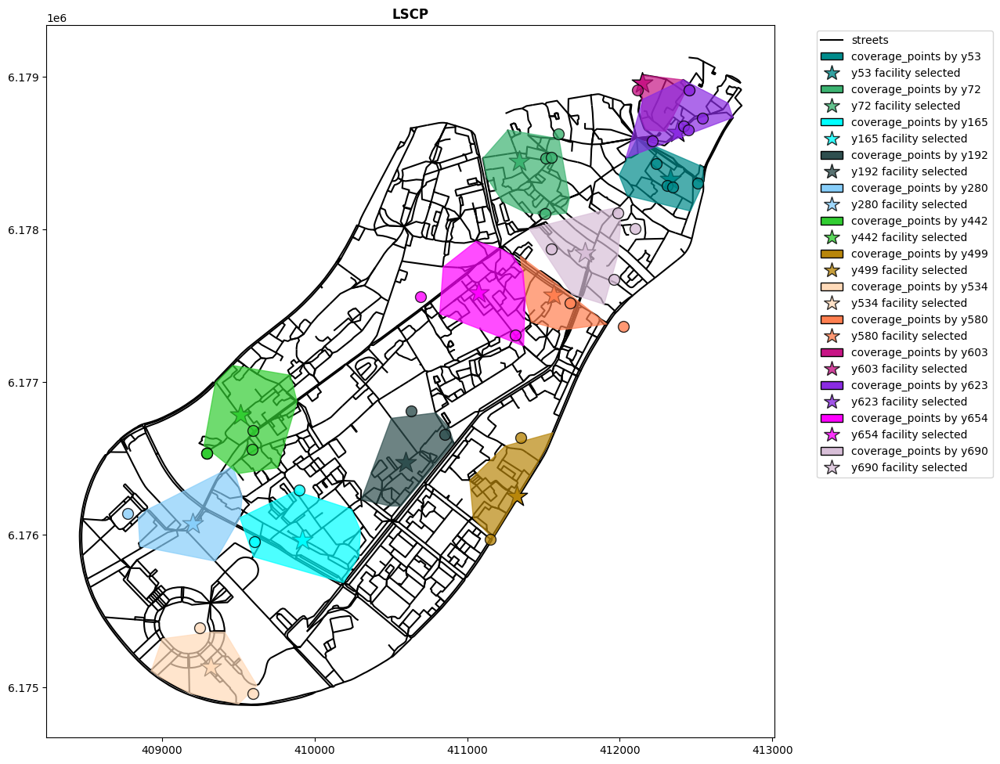

In [51]:
draw_isochrones(gdf_edges, gdf_nodes, gdf_nodes_iso, target_points_utm, info_slctd, dict_info)

As we can see, some isochrones contain only one point of interest.  
Let's check them in order to decide what to do with them.

In [64]:
target_points_utm

,Name,geometry
0,Стадион Лужники,POINT (409245.271 6175387.729)
1,Богородице-Смоленский Новодевичий монастырь,POINT (409293.945 6176532.721)
2,Собор Смоленской Иконы Божией Матери в Новодев...,POINT (409293.945 6176532.721)
3,Скульптура Дайте дорогу утятам,POINT (409293.945 6176532.721)
4,Новодевичье кладбище,POINT (409590.622 6176559.598)
5,Храм Успения Пресвятой Богородицы в Новодевичь...,POINT (409596.508 6176684.229)
6,Усадьба Трубецких,POINT (410631.160 6176807.714)
7,Фрунзенская набережная,POINT (411151.713 6175970.328)
8,Храм Святителя Николая в Хамовниках,POINT (411315.197 6177306.962)
9,Памятник героям фильма Офицеры,POINT (411353.825 6176636.525)


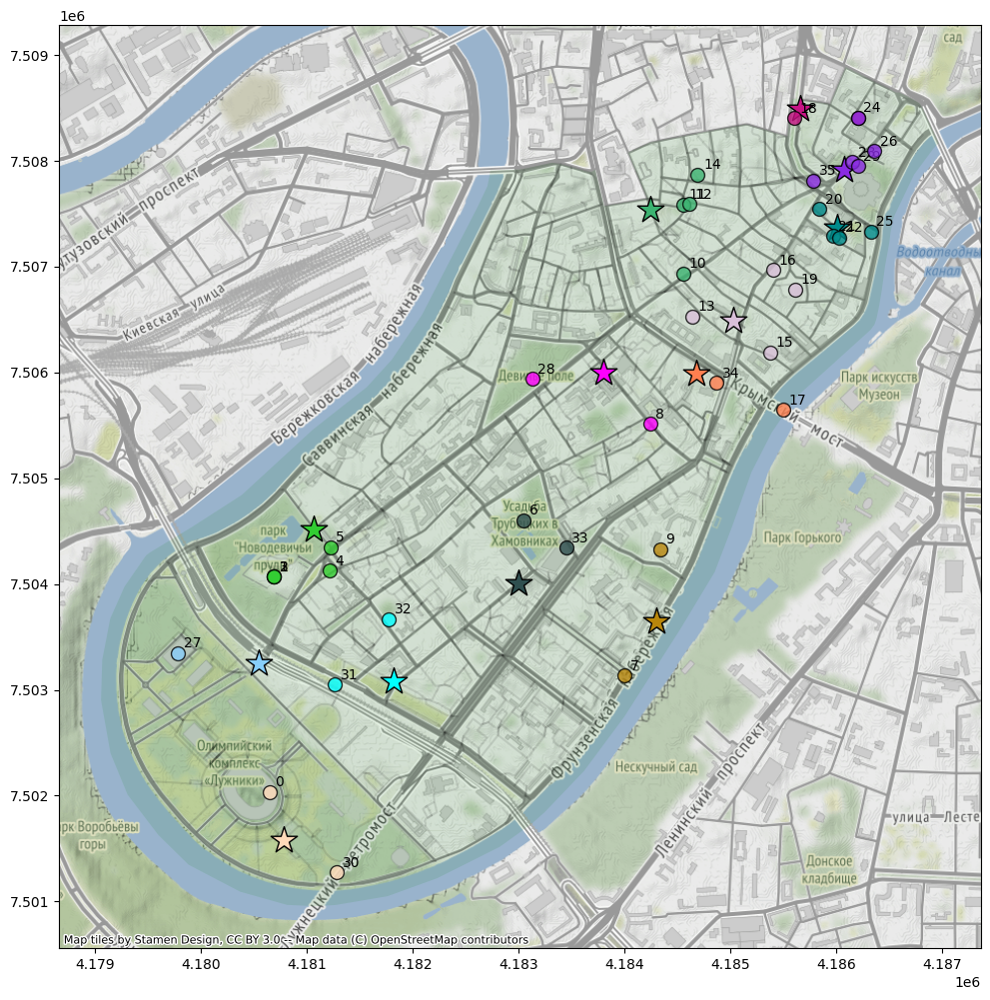

In [62]:
colors = ["darkcyan","mediumseagreen","cyan",
  "darkslategray", "lightskyblue","limegreen",
  "darkgoldenrod","peachpuff","coral","mediumvioletred",
  "blueviolet","fuchsia","thistle","lavender",
  "saddlebrown", 'red', 'blue', 'green', 'blue', 'brown']
dv_colors= dict(zip(
  info_slctd,colors))
fig,ax = plt.subplots(1,1,figsize=(12,12))
gdf_district.to_crs('epsg:3857').plot(ax=ax, color='green', alpha=0.1)
legend_elements = []

gdf_edges.to_crs('epsg:3857').plot(ax=ax,  color='black', alpha=0.1, zorder=1)
legend_elements.append(mlines.Line2D(
    [],[],
    color='black', label='streets',
))

for i in info_slctd:

    label = f"coverage_points by y{i}"

    legend_elements.append(Patch(facecolor=dv_colors[i], edgecolor="k", label=label))

    gdf_nodes.to_crs('epsg:3857').iloc[i:i+1].plot(ax=ax, 
                              zorder=3,
                              alpha=1,
                              edgecolor="k",
                              marker ='*',
                              color=dv_colors[i],
                              label=label, 
                              markersize=400)
    
    target_points_utm.to_crs('epsg:3857').iloc[dict_info[i]].plot(ax=ax,
                        marker="o",
                        markersize=100,
                        alpha=0.8,
                        zorder=4,
                        edgecolor="k",
                        facecolor=dv_colors[i])

for x, y, label in zip(target_points_utm.to_crs('epsg:3857').geometry.x, target_points_utm.to_crs('epsg:3857').geometry.y, target_points_utm.index):
    ax.annotate(label, xy=(x, y), xytext=(4, 4), textcoords="offset points")

ctx.add_basemap(ax=ax)

We managed to construct isochrones that cover 500m-distance to points of interest.  
However, it is important to note, that the result depends on the criteria by which we select points of interest: their number and location.


